In [ ]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib.lines import Line2D
from datetime import date, datetime
import nltk
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
from nltk.probability import FreqDist
from nltk.collocations import BigramCollocationFinder, BigramAssocMeasures
from nltk.sentiment.vader import SentimentIntensityAnalyzer
from sklearn.feature_extraction.text import CountVectorizer
from matplotlib.colors import LogNorm
from wordcloud import WordCloud
from collections import Counter
nltk.download('punkt')
nltk.download('stopwords')
nltk.download('vader_lexicon')
nltk.download('punkt_tab')
nltk.download('wordnet')
nltk.download('omw-1.4')


[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.
[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.
[nltk_data] Downloading package vader_lexicon to /root/nltk_data...
[nltk_data] Downloading package punkt_tab to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt_tab.zip.
[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data] Downloading package omw-1.4 to /root/nltk_data...


True

In [ ]:
df = pd.read_csv('post_label.csv')

In [ ]:
df.head()

,Unnamed: 0,ID,Date,Subreddit,URL,Title,Text,Author,Score,num_comment,Post,PostClean,emotion,hate,irony,offensive,sentiment
0,0,1gl2h1y,2024-11-06 16:28:01,womenintech,https://www.reddit.com/r/womenintech/comments/...,Election talk at work: don’t take the bait,"If anyone, but especially men, at work want to...",user_1,10676,484,Election talk at work: don’t take the bait If...,election talk work don take bait anyone especi...,anger,not-hate,non_irony,not-offensive,neutral
1,1,1hcv1ab,2024-12-12 20:51:55,womenintech,https://www.reddit.com/r/womenintech/comments/...,Stand your ground. You’re not a secretary,What are the creative ways you’ve had to tell ...,user_2,5001,396,Stand your ground. You’re not a secretary Wha...,stand ground you re secretary creative ways yo...,anger,not-hate,non_irony,not-offensive,neutral
2,2,1fzvk1s,2024-10-09 16:28:10,womenintech,https://fortune.com/2024/08/08/most-high-perfo...,Around 76% of high-performing women receive ne...,About 76% of top-performing working women rece...,user_3,4278,327,Around 76% of high-performing women receive ne...,around high performing women receive negative ...,sadness,not-hate,non_irony,not-offensive,neutral
3,3,1eemu9y,2024-07-29 01:01:50,womenintech,https://www.reddit.com/r/womenintech/comments/...,Colleague assumed I was pregnant when I said “...,"A few weeks ago, I was taking a virtual meetin...",user_4,2698,148,Colleague assumed I was pregnant when I said “...,colleague assumed pregnant said news project m...,sadness,not-hate,non_irony,not-offensive,neutral
4,4,1ey5rsx,2024-08-22 00:32:53,womenintech,https://www.reddit.com/r/womenintech/comments/...,This is why women leave tech,I feel like I'm at a breaking point here. I lo...,user_5,2146,197,This is why women leave tech I feel like I'm a...,women leave tech feel like breaking point here...,optimism,not-hate,non_irony,not-offensive,positive


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2367 entries, 0 to 2366
Data columns (total 17 columns):
 #   Column       Non-Null Count  Dtype 
---  ------       --------------  ----- 
 0   Unnamed: 0   2367 non-null   int64 
 1   ID           2367 non-null   object
 2   Date         2367 non-null   object
 3   Subreddit    2367 non-null   object
 4   URL          2367 non-null   object
 5   Title        2367 non-null   object
 6   Text         2233 non-null   object
 7   Author       2367 non-null   object
 8   Score        2367 non-null   int64 
 9   num_comment  2367 non-null   int64 
 10  Post         2233 non-null   object
 11  PostClean    2233 non-null   object
 12  emotion      2367 non-null   object
 13  hate         2367 non-null   object
 14  irony        2367 non-null   object
 15  offensive    2367 non-null   object
 16  sentiment    2367 non-null   object
dtypes: int64(3), object(14)
memory usage: 314.5+ KB


# RQ1: Hate, Irony and Offensive Analysis

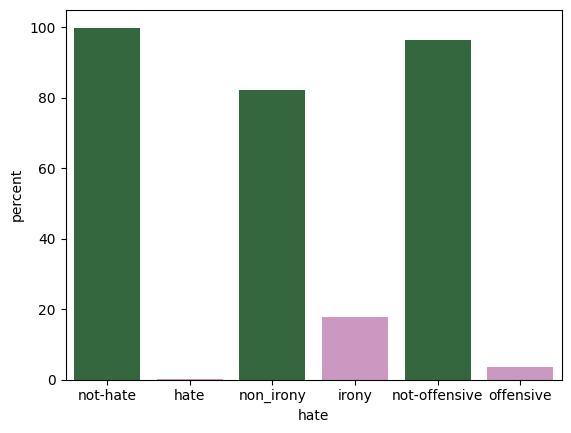

In [ ]:
# Hate, Irony and Offensive percentage
dfx = df.copy()
i = 0
for tp in ['hate', 'irony', 'offensive']:
  sns.countplot(x=tp, data=dfx,stat='percent', hue = tp, palette='cubehelix')
  i += 1

  ## grafico empilhado para o artigo

In [ ]:
df['hate'] = df['hate'].replace({"hate": 'Yes', "not-hate": 'No'})
df['irony'] = df['irony'].replace({"irony": 'Yes', "non_irony": 'No'})
df['offensive'] = df['offensive'].replace({"offensive": 'Yes', "not-offensive": 'No'})


In [ ]:
# hate values
tbl_abs = df['hate'].value_counts(sort=False)
tbl_rel = tbl_abs/ tbl_abs.sum()
hate_df = pd.DataFrame({'abs':tbl_abs,'rel':tbl_rel})
hate_df

,abs,rel
hate,,
No,2366,0.999578
Yes,1,0.000422


In [ ]:
# irony values
tbl_abs = df['irony'].value_counts(sort=False)
tbl_rel = tbl_abs/ tbl_abs.sum()
irony_df = pd.DataFrame({'abs_irony':tbl_abs,'rel_irony':tbl_rel})
irony_df

,abs_irony,rel_irony
irony,,
No,1946,0.822138
Yes,421,0.177862


In [ ]:
# offensive values
tbl_abs = df['offensive'].value_counts(sort=False)
tbl_rel = tbl_abs/ tbl_abs.sum()
offensive_df = pd.DataFrame({'abs':tbl_abs,'rel':tbl_rel})
offensive_df

,abs,rel
offensive,,
No,2281,0.963667
Yes,86,0.036333


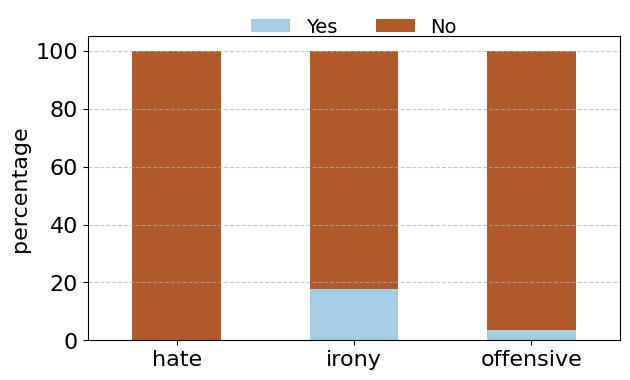

In [ ]:
df1 = df[['hate', 'irony', 'offensive']]
counts = df1.apply(lambda col: col.value_counts())
counts = counts.div(counts.sum(axis=0), axis=1) * 100
counts = counts.loc[['Yes', 'No']]
counts = counts.T
counts.plot(kind='bar',stacked=True, colormap="Paired")
plt.ylabel("percentage", fontsize=16)
plt.xticks(fontsize=16)
plt.yticks(fontsize=16)
plt.legend(
    loc='upper center',
    bbox_to_anchor=(0.5, 1.12),ncol=2,
    frameon=False,
    fontsize=14
)
plt.tight_layout()
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.xticks(rotation=0)
plt.savefig("per_discurso.png")
plt.show()

In [ ]:
# Terms analysis
def createMatrix(df:pd.DataFrame, field:str,term:str, title:str):
  df[field] = df[field].fillna('')
  vectorizer = CountVectorizer(stop_words='english', max_features=1000)
  X = vectorizer.fit_transform(df[field])
  term_matrix = pd.DataFrame(X.toarray(), columns=vectorizer.get_feature_names_out())
  term_matrix[term] = df[term]
  heatmap_data = term_matrix.groupby(term).sum()
  top_terms = heatmap_data.sum(axis=0).sort_values(ascending=False).head(20).index
  heatmap_filtered = heatmap_data[top_terms]
  plt.figure(figsize=(12, 6))
  sns.heatmap(heatmap_filtered.T, cmap='YlGnBu', annot=True, fmt='g')
  plt.title(title)
  plt.xlabel(term)
  plt.ylabel('terms')
  plt.tight_layout()
  plt.show()

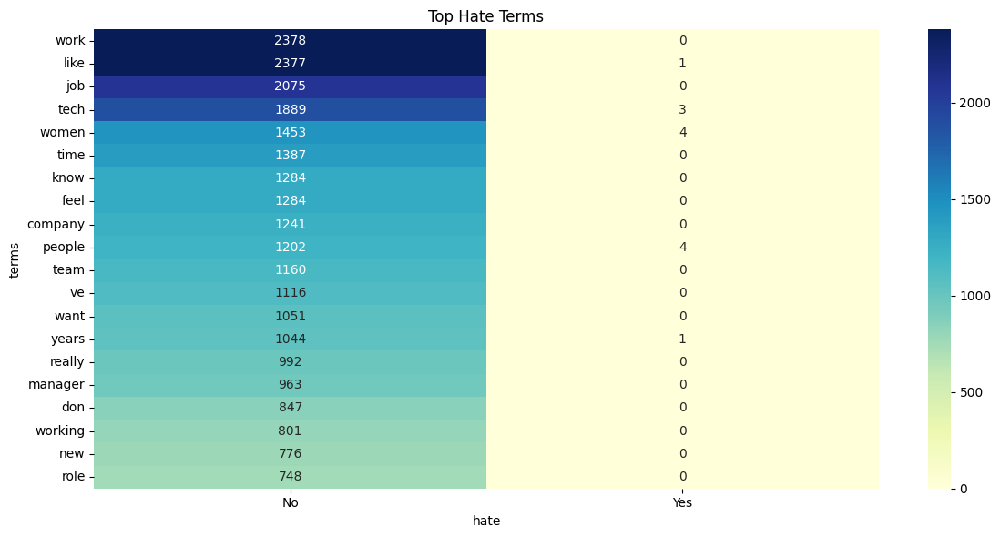

In [ ]:
createMatrix(df, 'PostClean', 'hate', 'Top Hate Terms')

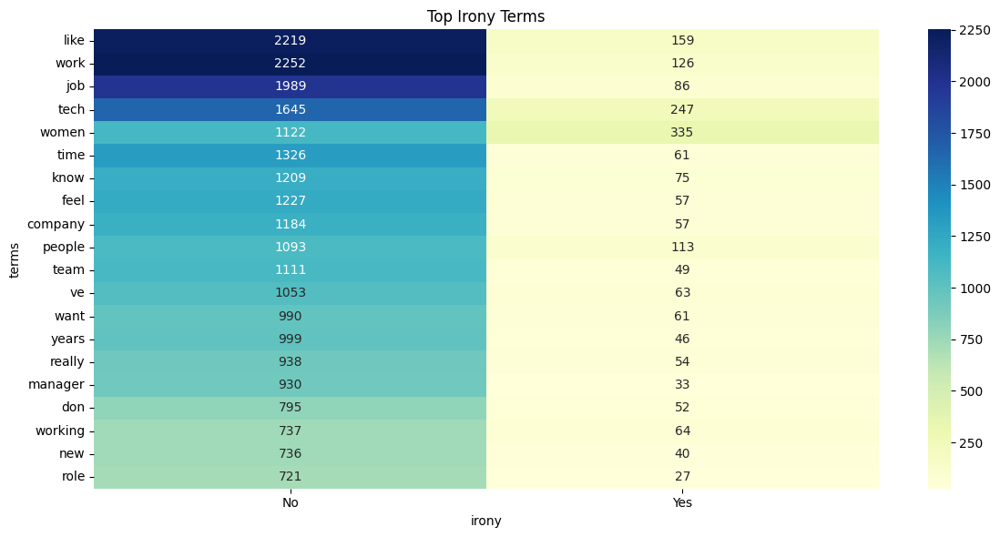

In [ ]:
createMatrix(df, 'PostClean', 'irony', 'Top Irony Terms')

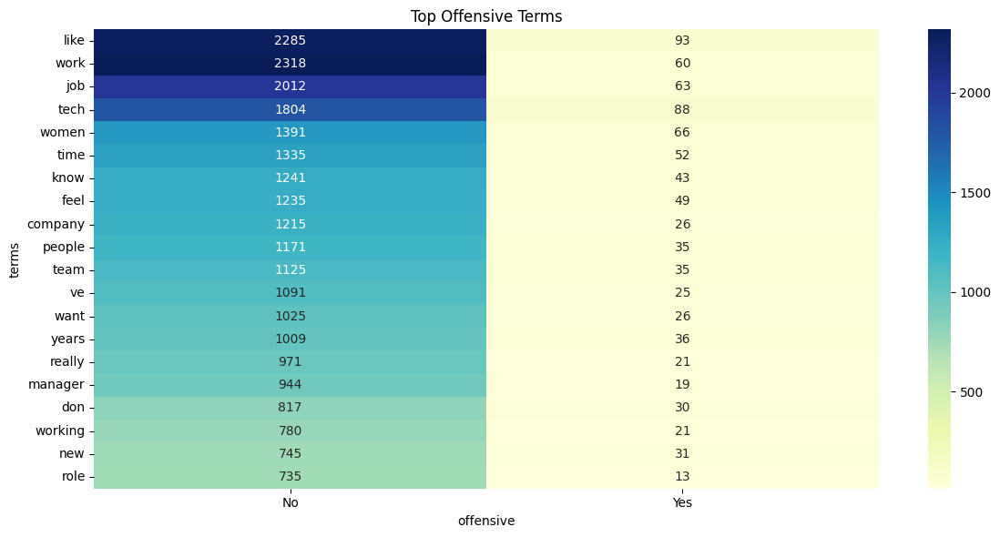

In [ ]:
createMatrix(df, 'PostClean', 'offensive', 'Top Offensive Terms')

In [ ]:
# sentiment by irony
# subset irony == yes
ir_df = df[df['irony']=='Yes']

In [ ]:
# Wordcloud
def creatCloud(df:pd.DataFrame, field:str, title:str, term_l:list):
  texto_completo = ' '.join(df[field].dropna().astype(str))
  term_l.extend(['thing','bro','us','ve','don','think','way','new','things'
                 'make','meeting','point','bros','guy','guys','take','much','didn',
                 'came','come','going','say','said', 'woman','go', 'gotten','hr','pm', 'done','two','one',
                 'getting','let','got','yet','three','every','often','many'])
  palavras = texto_completo.split()
  novo_texto = " ".join([palavra for palavra in palavras if palavra not in term_l])
  wordcloud = WordCloud(width=800, height=400, background_color='white').generate(novo_texto)
  plt.figure(figsize=(10, 5))
  plt.imshow(wordcloud, interpolation='bilinear')
  plt.axis('off')
  plt.savefig(f"cloud_{title}.png")
  plt.show()


In [ ]:
# contar termos
def contTerms(df:pd.DataFrame, field:str):
  term = ' '.join(df[field]).lower().split()
  freq = Counter(term)
  return freq.most_common(18)

In [ ]:
len(ir_df)

421

In [ ]:
ir_df['emotion'].value_counts()/len(ir_df)

,count
emotion,
joy,0.437055
anger,0.251781
sadness,0.213777
optimism,0.097387


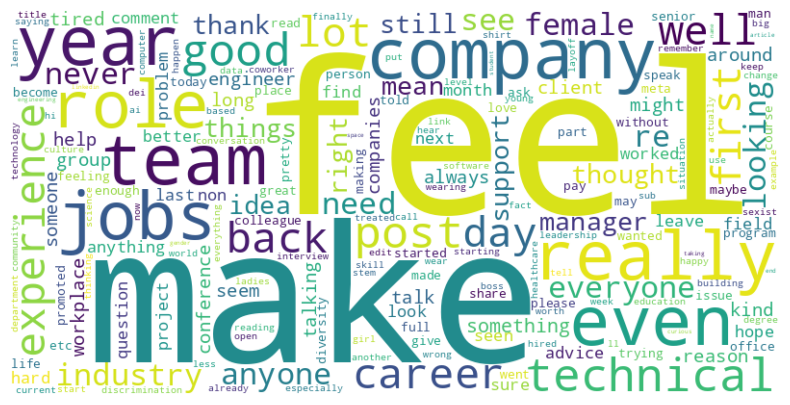

In [ ]:
# ironia =  Yes
x = contTerms(ir_df, 'PostClean',)
term_l = []
for i in x:
  term_l.append(i[0])
# irony total
creatCloud(ir_df, 'PostClean', "Irony", term_l)

In [ ]:
#irony by emotion
ir_df['emotion'].value_counts()

,count
emotion,
joy,184
anger,106
sadness,90
optimism,41


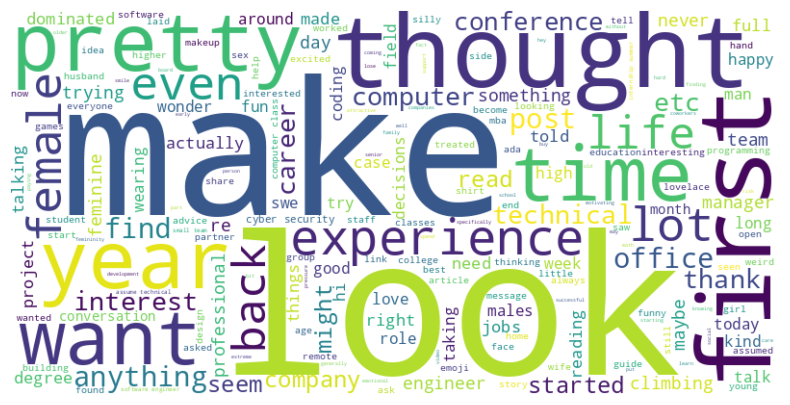

In [ ]:
### irony x joy
ij = ir_df[ir_df['emotion']=='joy']
x = contTerms(ij, 'PostClean',)
term_l = []
for i in x:
  term_l.append(i[0])
creatCloud(ij, 'PostClean', "Irony X Joy",term_l)

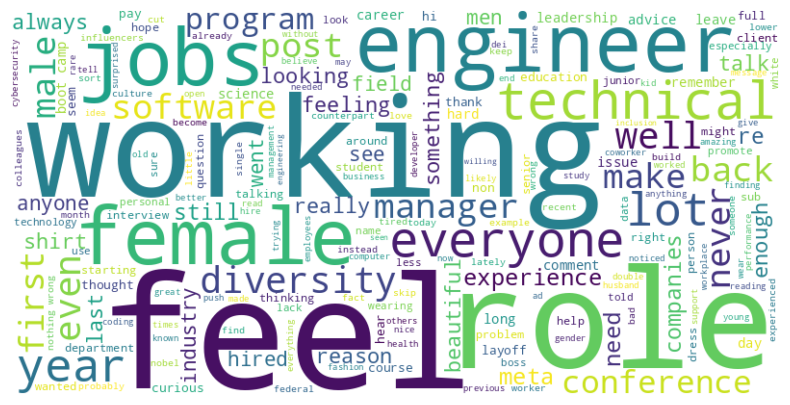

In [ ]:
### irony x Sadness
ij = ir_df[ir_df['emotion']=='sadness']
x = contTerms(ij, 'PostClean',)
term_l = []
for i in x:
  term_l.append(i[0])
creatCloud(ij, 'PostClean', "Irony X Sadness",term_l)

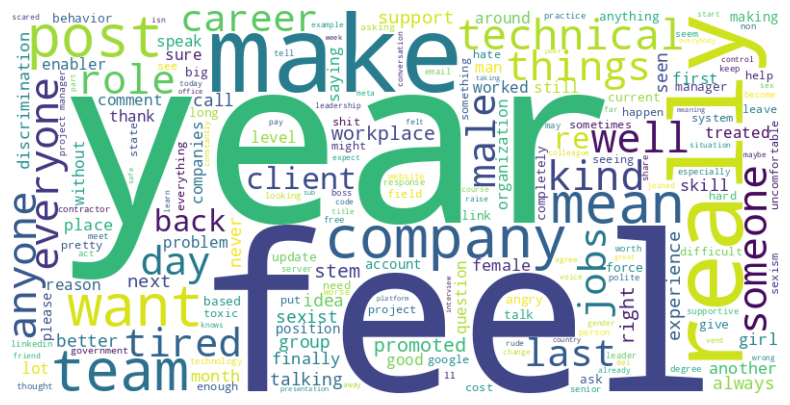

In [ ]:
### irony x anger
ij = ir_df[ir_df['emotion']=='anger']
x = contTerms(ij, 'PostClean',)
term_l = []
for i in x:
  term_l.append(i[0])
creatCloud(ij, 'PostClean','Irony X Anger',term_l)

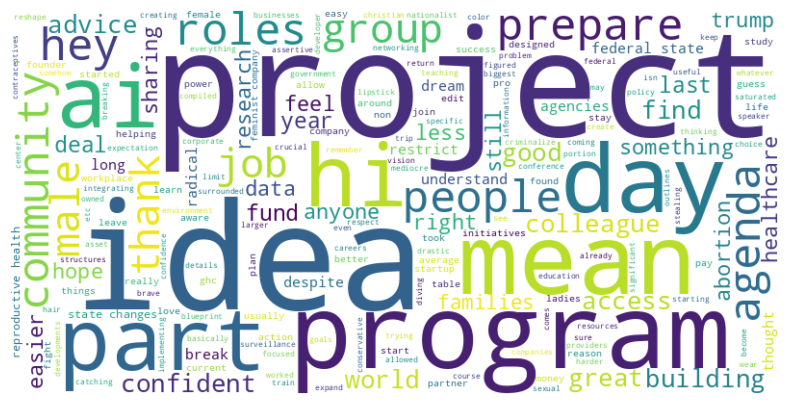

In [ ]:
### irony x optimism
ij = ir_df[ir_df['emotion']=='optimism']
x = contTerms(ij, 'PostClean',)
term_l = []
for i in x:
  term_l.append(i[0])
creatCloud(ij, 'PostClean',"Irony X Optimism",term_l)
#

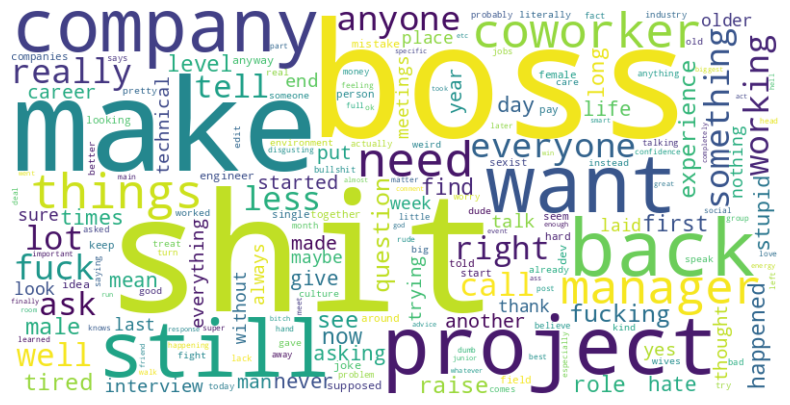

In [ ]:
# Offensive
off_df = df[df['offensive']=='Yes']
x = contTerms(off_df, 'PostClean',)
term_l = []
for i in x:
  term_l.append(i[0])
# irony total
creatCloud(off_df, 'PostClean', "Offensive", term_l)

#RQ2: Sentimental and Emotion Analysis

<Axes: xlabel='emotion', ylabel='percent'>

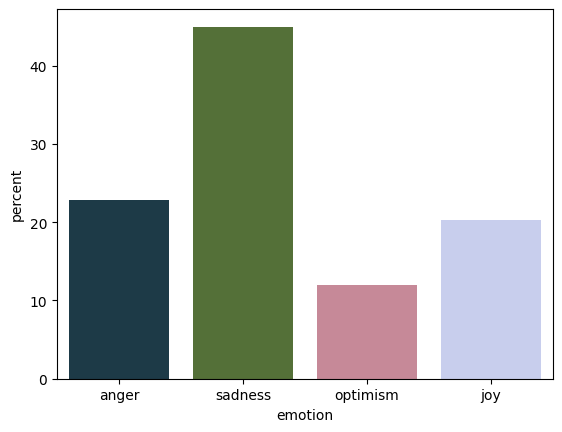

In [ ]:
## emotion %
sns.countplot(x='emotion', data=df,stat='percent', hue = 'emotion', palette='cubehelix')

In [ ]:
## emotion values
tbl_abs = df['emotion'].value_counts(sort=False)
tbl_rel = tbl_abs/ tbl_abs.sum()
emotion_df = pd.DataFrame({'abs':tbl_abs,'rel':tbl_rel})
emotion_df

,abs,rel
emotion,,
anger,540,0.228137
sadness,1065,0.449937
optimism,283,0.119561
joy,479,0.202366


<Axes: xlabel='sentiment', ylabel='percent'>

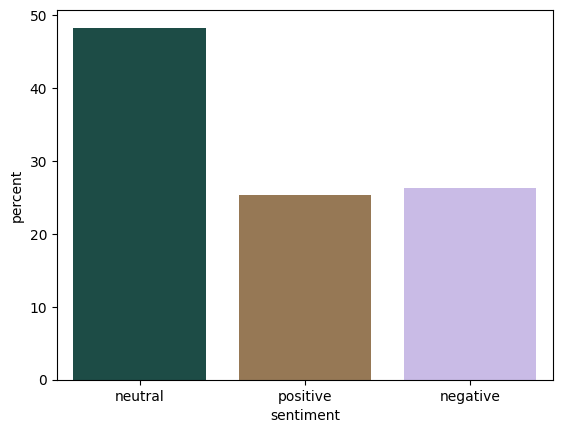

In [ ]:
## sentiment %
sns.countplot(x='sentiment', data=df,stat='percent', hue = 'sentiment', palette='cubehelix')

In [ ]:
## emotion values
tbl_abs = df['sentiment'].value_counts(sort=False)
tbl_rel = tbl_abs/ tbl_abs.sum()
sentiment_df = pd.DataFrame({'abs':tbl_abs,'rel':tbl_rel})
sentiment_df

,abs,rel
sentiment,,
neutral,1143,0.482890
positive,601,0.253908
negative,623,0.263202


In [ ]:
## abs value
df_sent = df.groupby(['sentiment','emotion'])
df_sent['emotion'].count().to_latex("tbl_abs")
df_sent['emotion'].count()

sentiment  emotion 
negative   anger       303
           joy           2
           sadness     318
neutral    anger       215
           joy         215
           optimism    142
           sadness     571
positive   anger        22
           joy         262
           optimism    141
           sadness     176
Name: emotion, dtype: int64

In [ ]:
## relative value (total)
sent_s = df_sent['emotion'].count().transform(lambda x: 100 * x / x.sum())
sent_s = pd.DataFrame(sent_s)
sent_s.columns = ['value']
df_s = sent_s.reset_index()

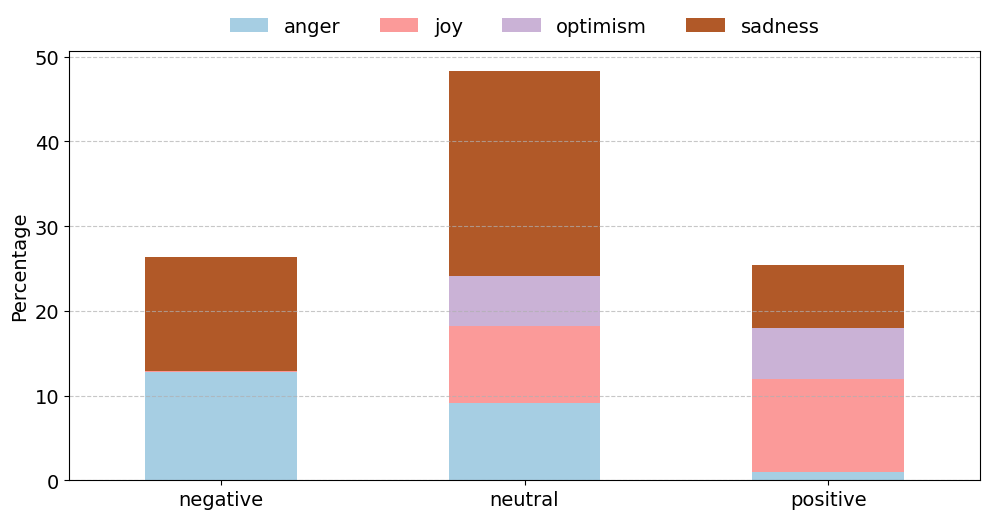

In [ ]:
## sentiment vs emotion
pivot_df = df_s.pivot_table(
    index="sentiment",
    columns="emotion",
    values="value",
    aggfunc="sum",
    fill_value=0
)
pivot_df.plot(
    kind="bar",
    stacked=True,
    colormap="Paired",
    figsize=(10, 6),
)
plt.ylabel("Percentage", fontsize=14)
plt.xlabel("")
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.legend(
    loc='upper center',
    bbox_to_anchor=(0.5, 1.12),ncol=4,
    frameon=False, fontsize=14)
plt.tight_layout()
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.xticks(rotation=0)
plt.savefig("emotion_sentiment.png")
plt.show()

In [ ]:
## % emotion by sentiment

In [ ]:
## negative values
neg_df = df[df['sentiment'] == 'negative']
tbl_abs = neg_df['emotion'].value_counts(sort=False)
tbl_rel = tbl_abs/ tbl_abs.sum()
es_df = pd.DataFrame({'abs':tbl_abs,'rel':tbl_rel})
es_df

,abs,rel
emotion,,
anger,303,0.486356
sadness,318,0.510433
joy,2,0.003210


In [ ]:
## positive values
pos_df = df[df['sentiment'] == 'positive']
tbl_abs = pos_df['emotion'].value_counts(sort=False)
tbl_rel = tbl_abs/ tbl_abs.sum()
es_df = pd.DataFrame({'abs':tbl_abs,'rel':tbl_rel})
es_df

,abs,rel
emotion,,
optimism,141,0.234609
sadness,176,0.292845
anger,22,0.036606
joy,262,0.435940


In [ ]:
## neutral values
neu_df = df[df['sentiment'] == 'neutral']
pos_df = df[df['sentiment'] == 'positive']
tbl_abs = neu_df['emotion'].value_counts(sort=False)
tbl_rel = tbl_abs/ tbl_abs.sum()
es_df = pd.DataFrame({'abs':tbl_abs,'rel':tbl_rel})
es_df

,abs,rel
emotion,,
anger,215,0.188101
sadness,571,0.499563
optimism,142,0.124234
joy,215,0.188101


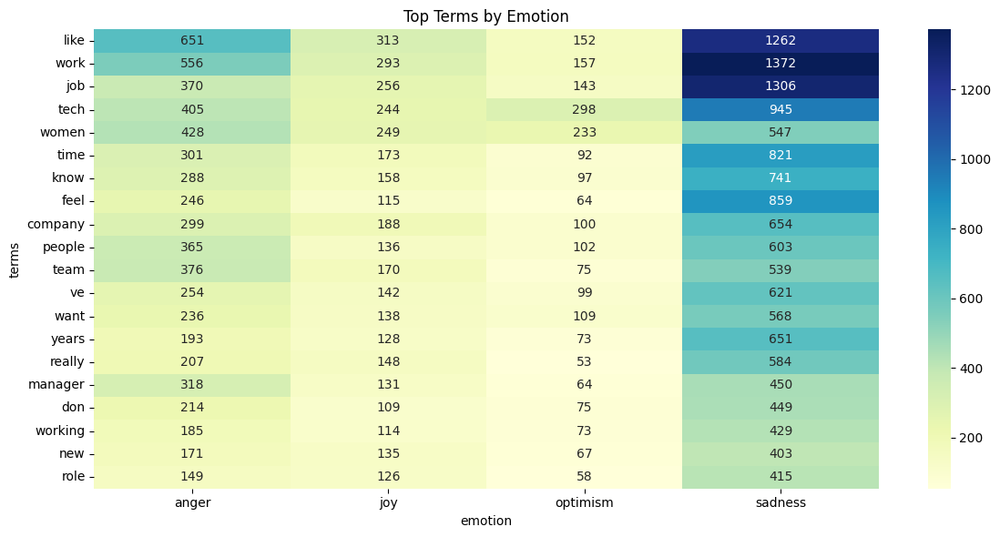

In [ ]:
# Terms analysis - Emotion
createMatrix(df, 'PostClean', 'emotion', 'Top Terms by Emotion')

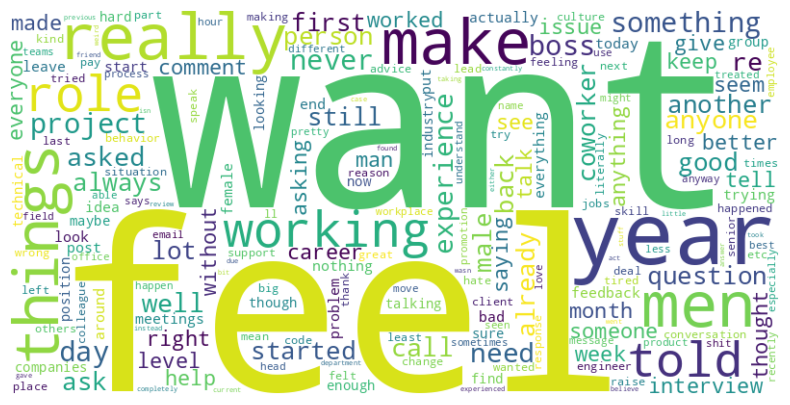

In [ ]:
# emotion anger
a_df = df[df['emotion'] == 'anger']
x = contTerms(a_df, 'PostClean',)
term_l = []
for i in x:
  term_l.append(i[0])
creatCloud(a_df, 'PostClean', "Anger",term_l)

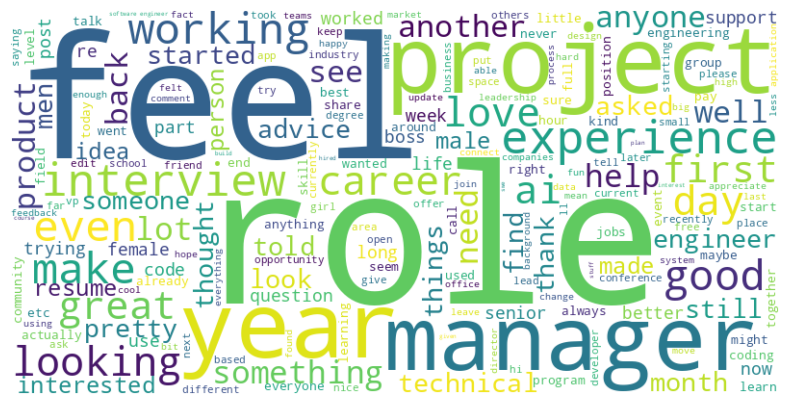

In [ ]:
# emotion joy
a_df = df[df['emotion'] == 'joy']
x = contTerms(a_df, 'PostClean',)
term_l = []
for i in x:
  term_l.append(i[0])
creatCloud(a_df, 'PostClean', "Joy",term_l)

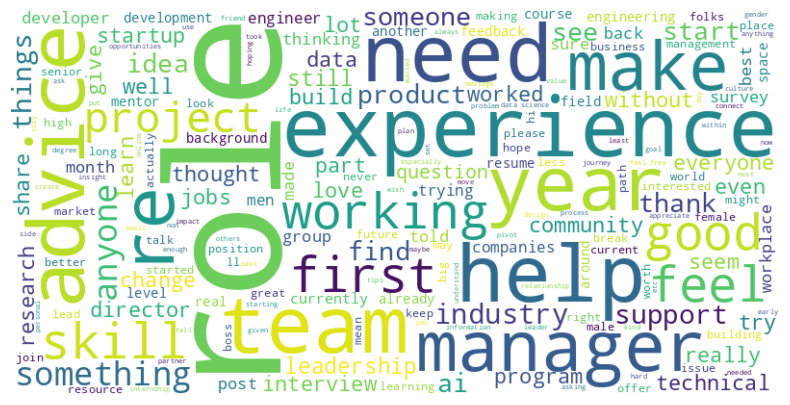

In [ ]:
# emotion optimism
a_df = df[df['emotion'] == 'optimism']
x = contTerms(a_df, 'PostClean',)
term_l = []
for i in x:
  term_l.append(i[0])
creatCloud(a_df, 'PostClean', "Optimism",term_l)

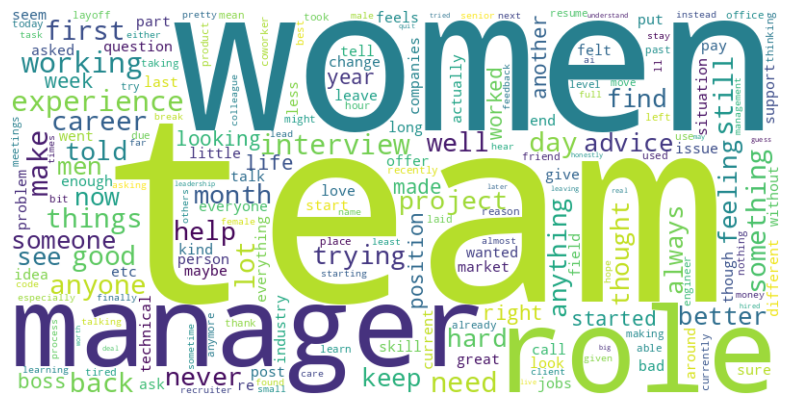

In [ ]:
# emotion sadness
a_df = df[df['emotion'] == 'sadness']
x = contTerms(a_df, 'PostClean',)
term_l = []
for i in x:
  term_l.append(i[0])
creatCloud(a_df, 'PostClean', "Sadness",term_l)

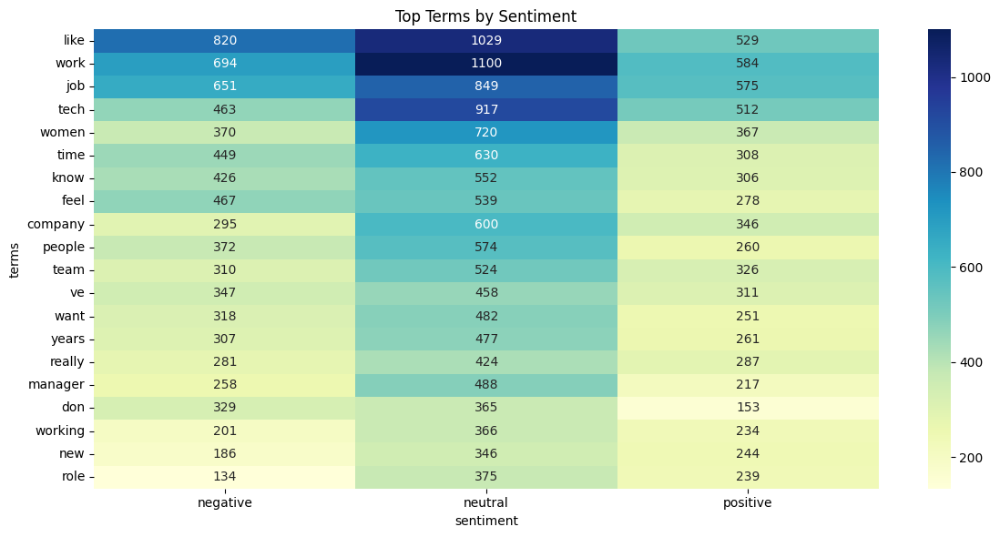

In [ ]:
# Terms analysis - Sentiment
createMatrix(df, 'PostClean', 'sentiment', 'Top Terms by Sentiment')

In [ ]:
# 4. Terms by sentiment
'''
term_matrix['sentiment'] = df['sentiment']
term_counts = term_matrix.groupby('sentiment').sum().drop(columns=['emotion'], errors='ignore')
top_terms = term_counts.sum().sort_values(ascending=False).head(10).index
plot_data = term_counts[top_terms].T
plot_data.plot(kind='bar', stacked=True, figsize=(10, 6), colormap='Paired')
plt.title('Terms by Sentimento')
plt.xlabel('Terms')
plt.ylabel('Frequency')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show() '''

"\nterm_matrix['sentiment'] = df['sentiment']\nterm_counts = term_matrix.groupby('sentiment').sum().drop(columns=['emotion'], errors='ignore')\ntop_terms = term_counts.sum().sort_values(ascending=False).head(10).index\nplot_data = term_counts[top_terms].T\nplot_data.plot(kind='bar', stacked=True, figsize=(10, 6), colormap='Paired')\nplt.title('Terms by Sentimento')\nplt.xlabel('Terms')\nplt.ylabel('Frequency')\nplt.xticks(rotation=45)\nplt.tight_layout()\nplt.show() "

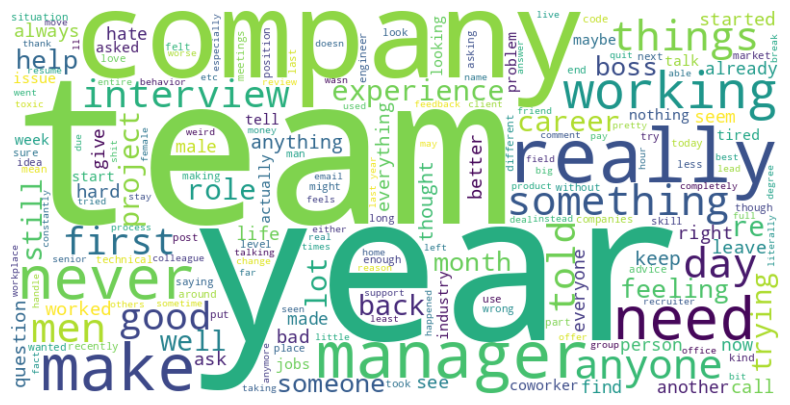

In [ ]:
a_df = df[df['sentiment'] == 'negative']
x = contTerms(a_df, 'PostClean',)
term_l = []
for i in x:
  term_l.append(i[0])
creatCloud(a_df, 'PostClean', "Negative",term_l)

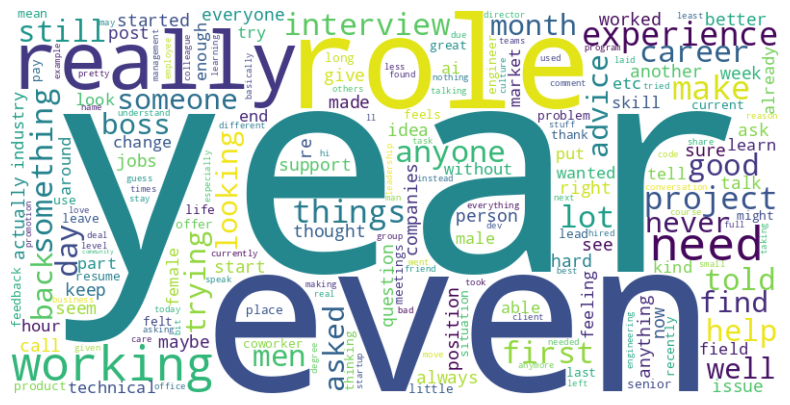

In [ ]:
a_df = df[df['sentiment'] == 'neutral']
x = contTerms(a_df, 'PostClean',)
term_l = []
for i in x:
  term_l.append(i[0])
creatCloud(a_df, 'PostClean', "Neutral",term_l)

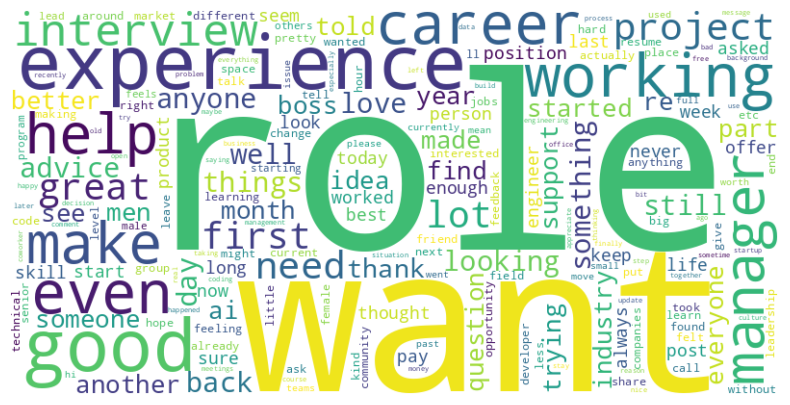

In [ ]:
a_df = df[df['sentiment'] == 'positive']
x = contTerms(a_df, 'PostClean',)
term_l = []
for i in x:
  term_l.append(i[0])
creatCloud(a_df, 'PostClean', "Positive",term_l)

# RQ3: Temporal Analysis

<Axes: xlabel='dt'>

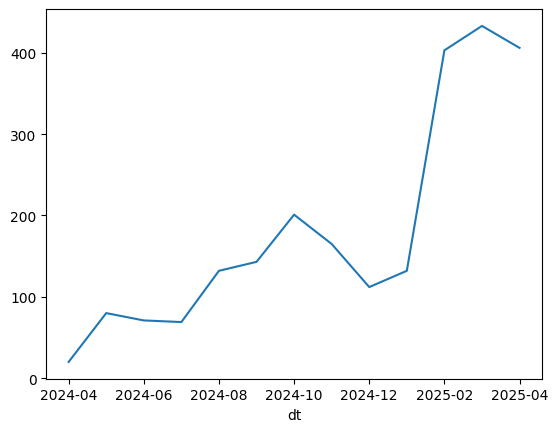

In [ ]:
## group by year/month
df['Date'] = pd.to_datetime(df['Date'])
df['dt'] = df['Date'].dt.strftime('%Y-%m')
value_dt = pd.Series(df.groupby('dt')['Date'].count())
value_dt.plot(kind='line')

<ipython-input-50-849e553164b7>:4: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(x='dt', data=df_sort,stat='percent',palette='cubehelix')


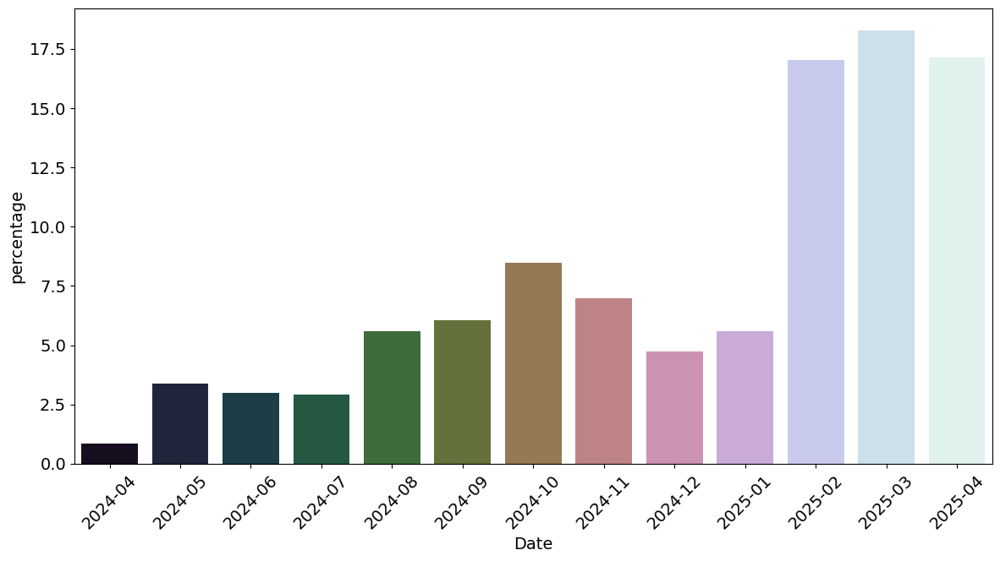

In [ ]:
# post by month
df_sort = df.sort_values(by='dt')
plt.figure(figsize=(14, 7))
sns.countplot(x='dt', data=df_sort,stat='percent',palette='cubehelix')
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.ylabel("percentage", fontsize=14)
plt.xlabel("Date", fontsize = 14)
plt.xticks(rotation=45)
plt.savefig("vol_post.png")
plt.show()

In [ ]:
df_sort['dt'].value_counts()/len(df_sort)*100

,count
dt,
2025-03,18.293198
2025-04,17.152514
2025-02,17.025771
2024-10,8.491762
2024-11,6.970849
2024-09,6.041403
2024-08,5.576679
2025-01,5.576679
2024-12,4.731728


In [ ]:
# when started the  law
end = '2025-01-20'

In [ ]:
# before trump law
before = df[df['Date'] < end]
# abs value
abs = before.ID.count()
# relative value
rel = abs/ len(df)
print(f" absolute: {abs} relative: {rel}")

 absolute: 1050 relative: 0.4435994930291508


In [ ]:
# after trump law
after = df[df['Date'] >= end]
# abs value
abs = after.ID.count()
# relative value
rel = abs/ len(df)
print(f" absolute: {abs} relative: {rel}")

 absolute: 1317 relative: 0.5564005069708492


In [ ]:
## colum before  ** law type bool **
df['before'] = df['Date'] < end


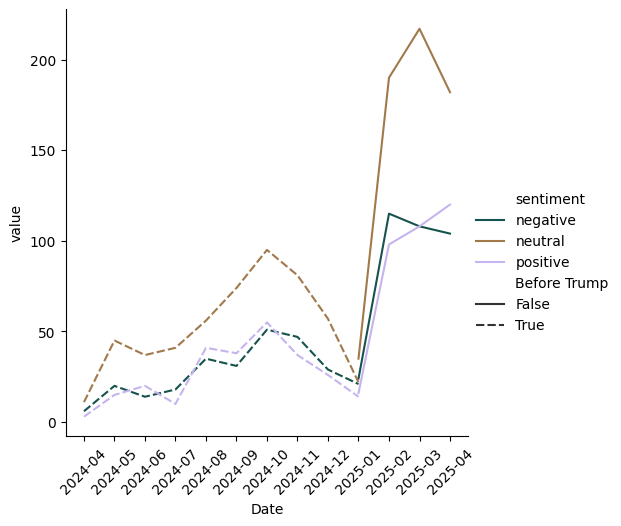

In [ ]:
 # sentiment by time
trump = pd.Series(df.groupby(['dt','sentiment','before'])['ID'].count())
label = trump.index.get_level_values('sentiment')
dt = trump.index.get_level_values('dt')
before= trump.index.get_level_values('before')
value = trump.values
df_trump = pd.DataFrame({'sentiment':label,'dt':dt,'Before Trump':before, "value":value})
 ### plot
sns.relplot(data=df_trump, kind="line",x="dt", y="value", hue="sentiment", style="Before Trump", palette='cubehelix')
plt.xlabel("Date")
plt.xticks(rotation=45)
plt.savefig("time_sentiment.png")
plt.show()


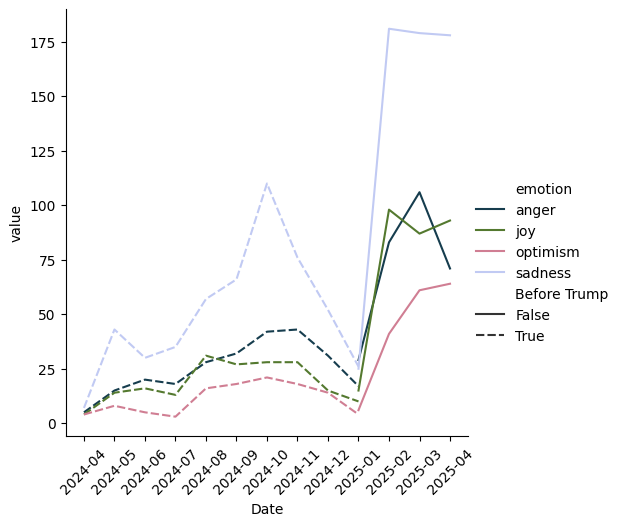

In [ ]:
 # emotion by time
trump = pd.Series(df.groupby(['dt','emotion','before'])['ID'].count())
label = trump.index.get_level_values('emotion')
dt = trump.index.get_level_values('dt')
before = trump.index.get_level_values('before')
value = trump.values
df_trump = pd.DataFrame({'emotion':label,'dt':dt,'Before Trump':before, "value":value})
 ### plot emotion
sns.relplot(data=df_trump, kind="line",x="dt", y="value", hue="emotion", style="Before Trump", palette='cubehelix')
plt.xlabel("Date")
plt.xticks(rotation=45)
plt.savefig("time_emotion.png")
plt.show()

([0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12],
 [Text(0, 0, '2024-04'),
  Text(1, 0, '2024-05'),
  Text(2, 0, '2024-06'),
  Text(3, 0, '2024-07'),
  Text(4, 0, '2024-08'),
  Text(5, 0, '2024-09'),
  Text(6, 0, '2024-10'),
  Text(7, 0, '2024-11'),
  Text(8, 0, '2024-12'),
  Text(9, 0, '2025-01'),
  Text(10, 0, '2025-02'),
  Text(11, 0, '2025-03'),
  Text(12, 0, '2025-04')])

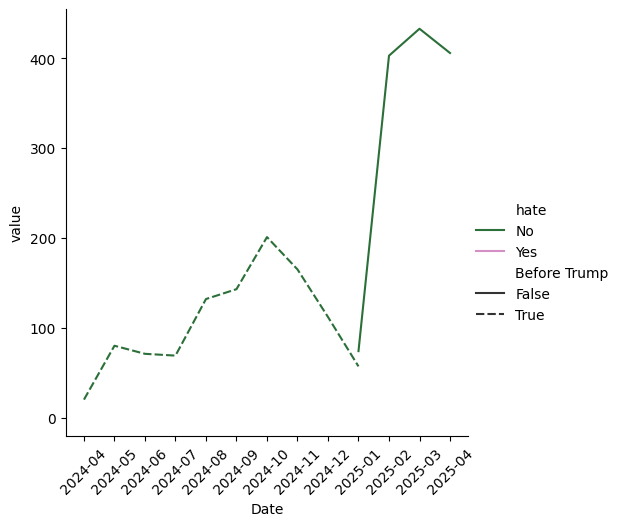

In [ ]:
 # hate by time
trump = pd.Series(df.groupby(['dt','hate','before'])['ID'].count())
label = trump.index.get_level_values('hate')
dt = trump.index.get_level_values('dt')
before = trump.index.get_level_values('before')
value = trump.values
df_trump = pd.DataFrame({'hate':label,'dt':dt,'Before Trump':before, "value":value})
 ### plot emotion
sns.relplot(data=df_trump, kind="line",x="dt", y="value", hue="hate", style="Before Trump", palette='cubehelix')
plt.xlabel("Date")
plt.xticks(rotation=45)

([0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12],
 [Text(0, 0, '2024-04'),
  Text(1, 0, '2024-05'),
  Text(2, 0, '2024-06'),
  Text(3, 0, '2024-07'),
  Text(4, 0, '2024-08'),
  Text(5, 0, '2024-09'),
  Text(6, 0, '2024-10'),
  Text(7, 0, '2024-11'),
  Text(8, 0, '2024-12'),
  Text(9, 0, '2025-01'),
  Text(10, 0, '2025-02'),
  Text(11, 0, '2025-03'),
  Text(12, 0, '2025-04')])

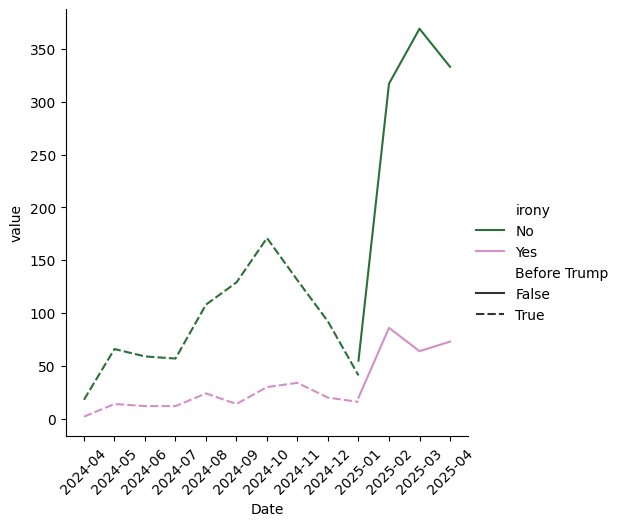

In [ ]:
 # irony by time
trump = pd.Series(df.groupby(['dt','irony','before'])['ID'].count())
label = trump.index.get_level_values('irony')
dt = trump.index.get_level_values('dt')
before = trump.index.get_level_values('before')
value = trump.values
df_trump = pd.DataFrame({'irony':label,'dt':dt,'Before Trump':before, "value":value})
 ### plot emotion
sns.relplot(data=df_trump, kind="line",x="dt", y="value", hue="irony", style="Before Trump", palette='cubehelix')
plt.xlabel("Date")
plt.xticks(rotation=45)

([0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12],
 [Text(0, 0, '2024-04'),
  Text(1, 0, '2024-05'),
  Text(2, 0, '2024-06'),
  Text(3, 0, '2024-07'),
  Text(4, 0, '2024-08'),
  Text(5, 0, '2024-09'),
  Text(6, 0, '2024-10'),
  Text(7, 0, '2024-11'),
  Text(8, 0, '2024-12'),
  Text(9, 0, '2025-01'),
  Text(10, 0, '2025-02'),
  Text(11, 0, '2025-03'),
  Text(12, 0, '2025-04')])

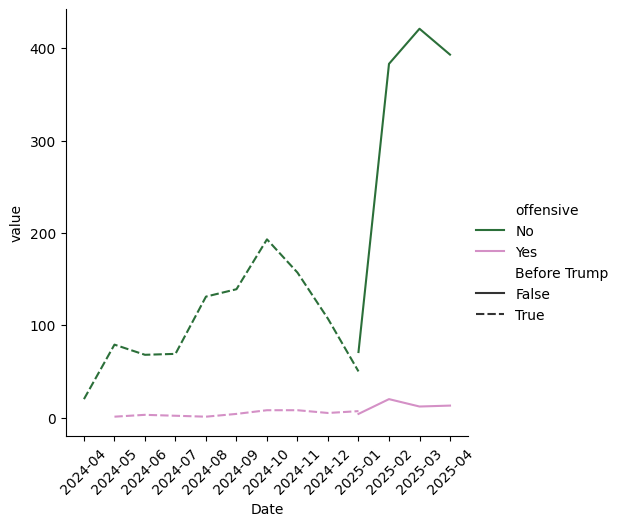

In [ ]:
 # Offensive by time
trump = pd.Series(df.groupby(['dt','offensive','before'])['ID'].count())
label = trump.index.get_level_values('offensive')
dt = trump.index.get_level_values('dt')
before = trump.index.get_level_values('before')
value = trump.values
df_trump = pd.DataFrame({'offensive':label,'dt':dt,'Before Trump':before, "value":value})
 ### plot emotion
sns.relplot(data=df_trump, kind="line",x="dt", y="value", hue="offensive", style="Before Trump", palette='cubehelix')
plt.xlabel("Date")
plt.xticks(rotation=45)

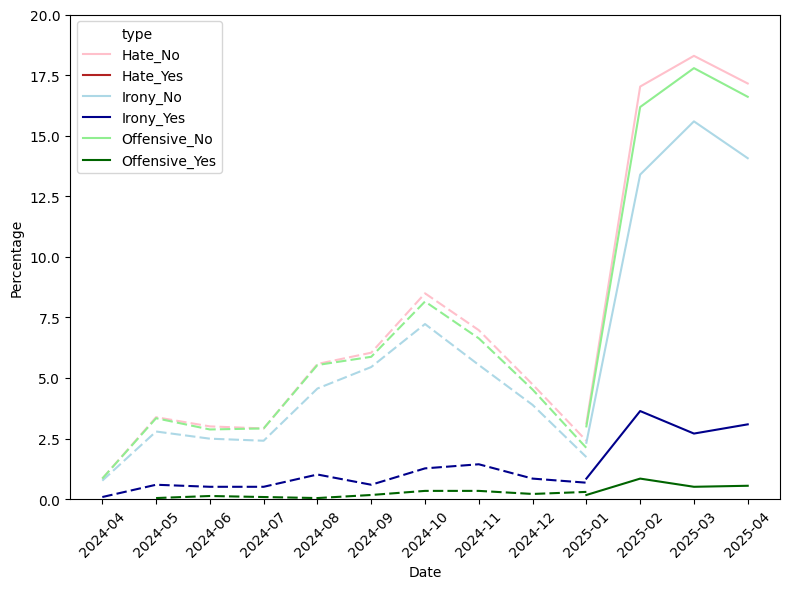

In [ ]:
# join features
dfs = []
for feat, color in [('hate', 'red'), ('irony', 'blue'), ('offensive', 'green')]:
    # group & count
    tmp = (
        df
        .groupby(['dt', feat, 'before'])['ID']
        .count()/len(df)*100)
    tmp = tmp.reset_index(name='value')
    tmp['feature'] = feat.capitalize() # H or I or O
    tmp['label']   = tmp[feat]
    dfs.append(tmp)

df_combo = pd.concat(dfs, ignore_index=True)

# key for subtitles
df_combo['type'] = df_combo['feature'] + '_' + df_combo['label']

# light x dark color
palette = {
    'Hate_Yes': '#B22222', # FireBrick
    'Hate_No': '#FFC0CB', # LightPink
    'Irony_Yes': '#00008B', # DarkBlue
    'Irony_No': '#ADD8E6', # LightBlue
    'Offensive_Yes': '#006400', # DarkGreen
    'Offensive_No': '#90EE90', # LightGreen
}

plt.figure(figsize=(8, 6))
plot=sns.lineplot(
    data=df_combo,
    x='dt', y='value',
    hue='type',
    style='before',
    dashes={True: (5, 2), False: ()},   # ---- if before
    palette=palette,
    markers=False
)
plt.ylim(0, 20)
plt.xlabel('Date')
plt.xticks(rotation=45)
plt.ylabel('Percentage')
handles, labels = plot.get_legend_handles_labels()
n_types = df_combo['type'].nunique()
plot.legend(handles[:n_types+1], labels[:n_types+1], title='', loc='upper left')
plt.tight_layout()
plt.savefig("temporal_linguistic.png")
plt.show()

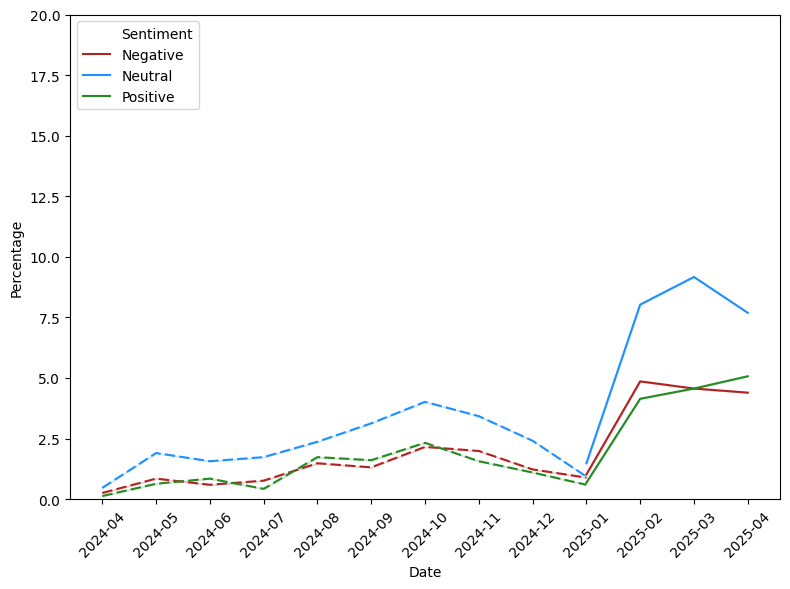

In [ ]:
dfs = []

for sentiment_value, color in [('negative', 'red'), ('neutral', 'blue'), ('positive', 'green')]:
    tmp = (
        df
        .groupby(['dt', 'sentiment', 'before'])['ID']
        .count()/len(df)*100)
    tmp = tmp.reset_index(name='value')
    tmp['feature'] = 'Sentiment'
    tmp['label'] = tmp['sentiment']
    dfs.append(tmp)

df_combo = pd.concat(dfs, ignore_index=True)

df_combo['Sentiment'] = df_combo['label'].str.capitalize()

palette = {
    'Negative': '#B22222',   # FireBrick
    'Neutral':  '#1E90FF',   # DodgerBlue
    'Positive': '#228B22',   # ForestGreen
}

# plot
plt.figure(figsize=(8, 6))
plot=sns.lineplot(
    data=df_combo,
    x='dt', y='value',
    hue='Sentiment',
    style='before',
    dashes={True: (5, 2), False: ()},
    palette=palette,
    markers=False
)
plt.ylim(0, 20)
plt.xlabel('Date')
plt.xticks(rotation=45)
plt.ylabel('Percentage')
handles, labels = plot.get_legend_handles_labels()
n_types = df_combo['Sentiment'].nunique()
plot.legend(handles[:n_types+1], labels[:n_types+1], title='', loc='upper left')
plt.tight_layout()
plt.savefig("temporal_sentiment.png")
plt.show()

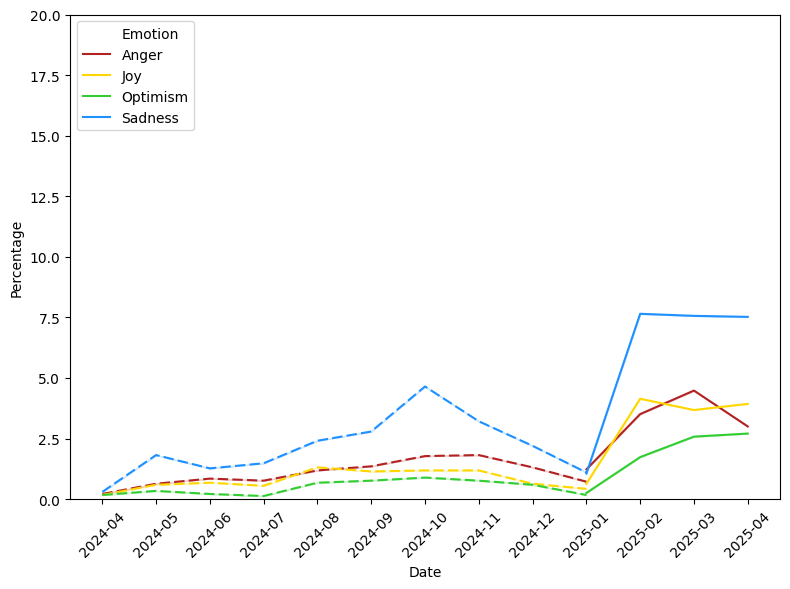

In [ ]:
dfs = []
for emotion_value in ['anger', 'joy', 'optimism', 'sadness']:
    tmp = (
        df
        .groupby(['dt', 'emotion', 'before'])['ID']
        .count()/len(df)*100)
    tmp = tmp.reset_index(name='value')
    tmp['feature'] = 'Emotion'
    tmp['label'] = tmp['emotion']
    dfs.append(tmp)

df_combo = pd.concat(dfs, ignore_index=True)
df_combo['Emotion'] = df_combo['label'].str.capitalize()

# definir paleta de cores
palette = {
    'Anger': '#B22222',     # FireBrick
    'Joy': '#FFD700',       # Gold
    'Optimism': '#32CD32',  # LimeGreen
    'Sadness': '#1E90FF',   # DodgerBlue
}

# criar o gráfico
plt.figure(figsize=(8, 6))
plot = sns.lineplot(
    data=df_combo,
    x='dt', y='value',
    hue='Emotion',
    style='before',
    dashes={True: (5, 2), False: ()},
    palette=palette,
    markers=False
)
plt.ylim(0, 20)
plt.xlabel('Date')
plt.xticks(rotation=45)
plt.ylabel('Percentage')

# remover a legenda do 'style'
handles, labels = plot.get_legend_handles_labels()
n_types = df_combo['Emotion'].nunique()
plot.legend(handles[:n_types+1], labels[:n_types+1], title='', loc='upper left')
plt.tight_layout()
plt.savefig("temporal_emotion.png")
plt.show()

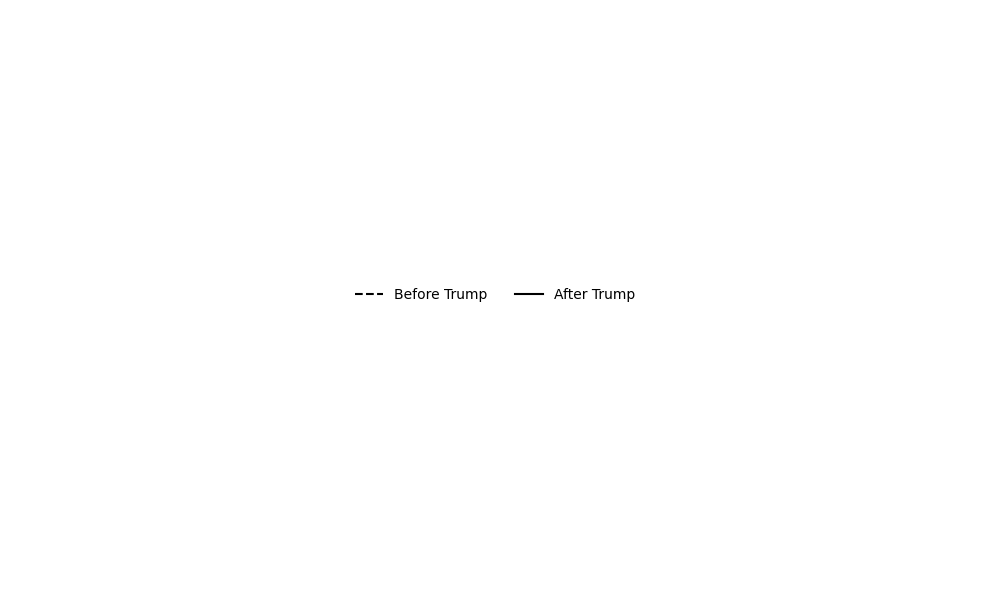

In [ ]:


fig, ax = plt.subplots(figsize=(4, 1))

legend_elements = [Line2D([0], [0], color='black', linestyle='--', label='Before Trump'),
                   Line2D([0], [0], color='black', linestyle='-', label='After Trump')]

ax.axis('off')

ax.legend(
    handles=legend_elements,
    loc='center',
    ncol=2,
    frameon=False,
    handlelength=2,
)

plt.tight_layout()
plt.savefig("temporal_legend.png")
plt.show()

In [ ]:
dfb = df[df['before']==True]
dff = df[df['before']==False]

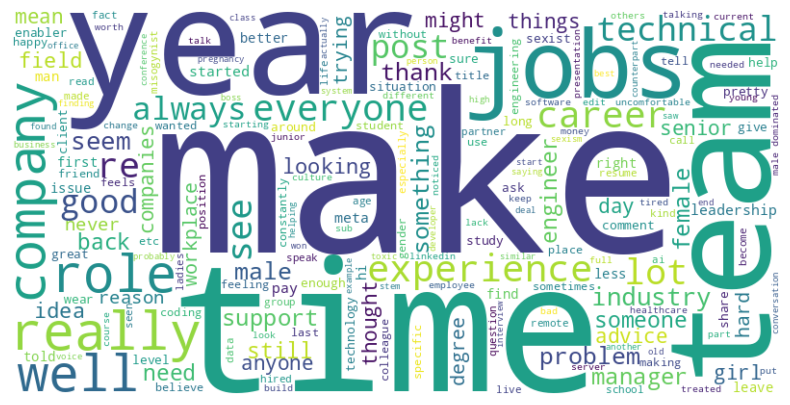

In [ ]:
# Before irony
df_i = dfb[dfb['irony']=='Yes']
x = contTerms(df_i, 'PostClean',)
term_l = []
for i in x:
  term_l.append(i[0])
creatCloud(df_i, 'PostClean', "BeforeTrumpIrony",term_l)

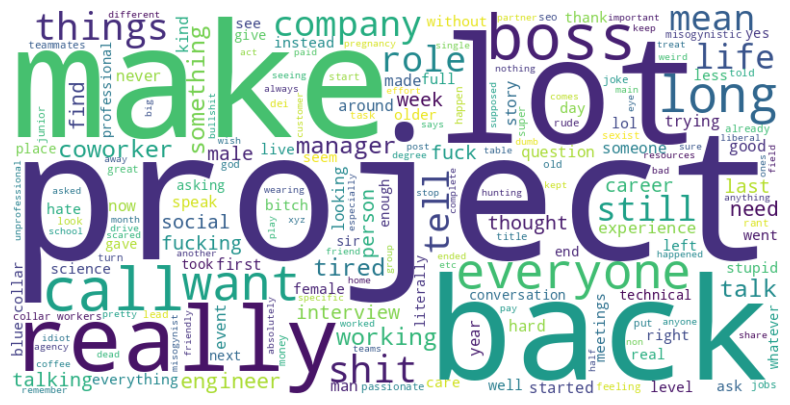

In [ ]:
#before  - Offensive
d = dfb[dfb['offensive']=='Yes']
x = contTerms(off_df, 'PostClean',)
term_l = []
for i in x:
  term_l.append(i[0])
# irony total
creatCloud(d, 'PostClean', "BeforeTrumpOffensive", term_l)

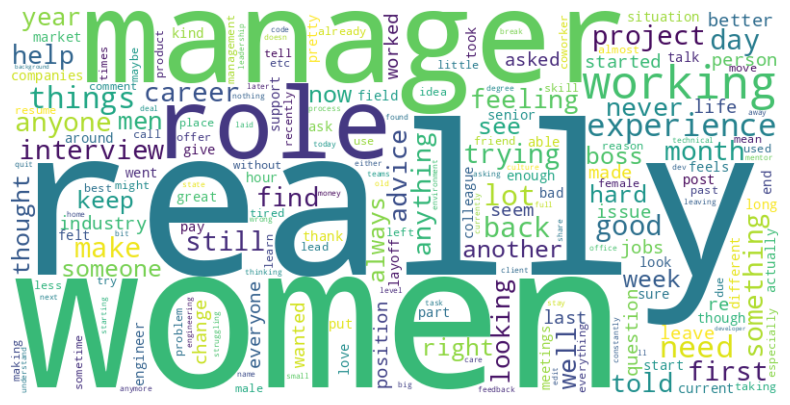

In [ ]:
#before emotion sadness
df_i = dfb[dfb['emotion']=='sadness']
x = contTerms(df_i, 'PostClean',)
term_l = []
for i in x:
  term_l.append(i[0])
creatCloud(df_i, 'PostClean', "BeforeTrumpSadness",term_l)

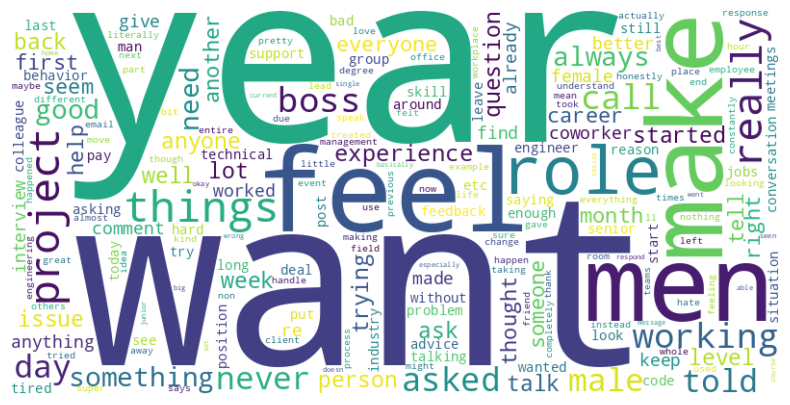

In [ ]:
#before emotiom anger
df_i = dfb[dfb['emotion']=='anger']
x = contTerms(df_i, 'PostClean',)
term_l = []
for i in x:
  term_l.append(i[0])
creatCloud(df_i, 'PostClean', "BeforeTrumpAnger",term_l)

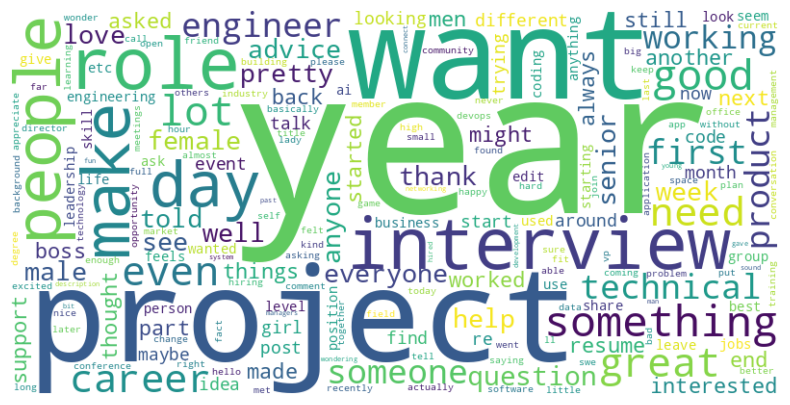

In [ ]:
#before emotion joy
df_i = dfb[dfb['emotion']=='joy']
x = contTerms(df_i, 'PostClean',)
term_l = []
for i in x:
  term_l.append(i[0])
creatCloud(df_i, 'PostClean', "BeforeTrumpJoy",term_l)

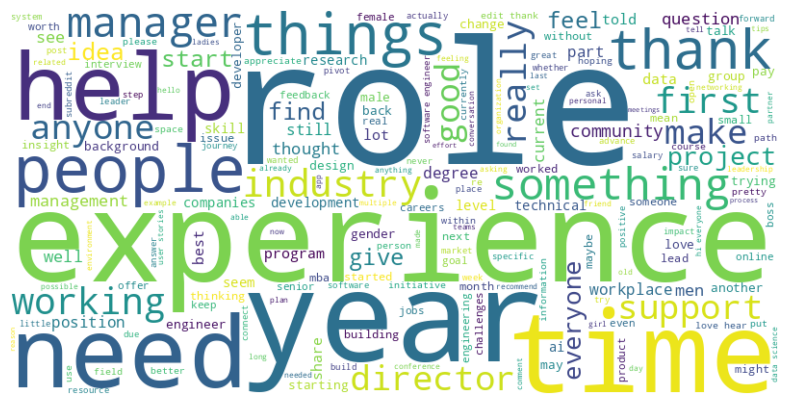

In [ ]:
#before emotion optimism
df_i = dfb[dfb['emotion']=='optimism']
x = contTerms(df_i, 'PostClean',)
term_l = []
for i in x:
  term_l.append(i[0])
creatCloud(df_i, 'PostClean', "BeforeTrumpOptimis",term_l)

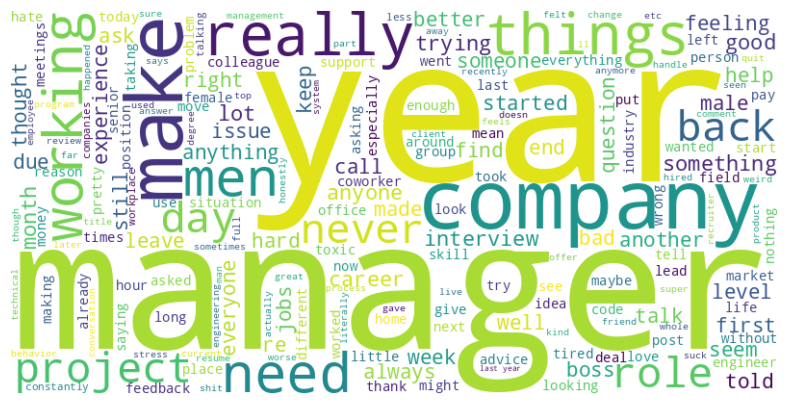

In [ ]:
# before sentiment negative
df_i = dfb[dfb['sentiment']=='negative']
x = contTerms(df_i, 'PostClean',)
term_l = []
for i in x:
  term_l.append(i[0])
creatCloud(df_i, 'PostClean', "BeforeTrumpNegative", term_l)

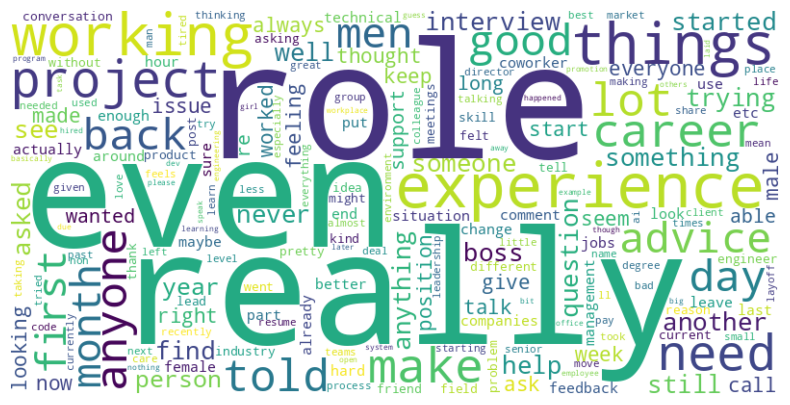

In [ ]:
df_i = dfb[dfb['sentiment']=='neutral']
x = contTerms(df_i, 'PostClean',)
term_l = []
for i in x:
  term_l.append(i[0])
creatCloud(df_i, 'PostClean', "BeforeTrumpNeutral", term_l)

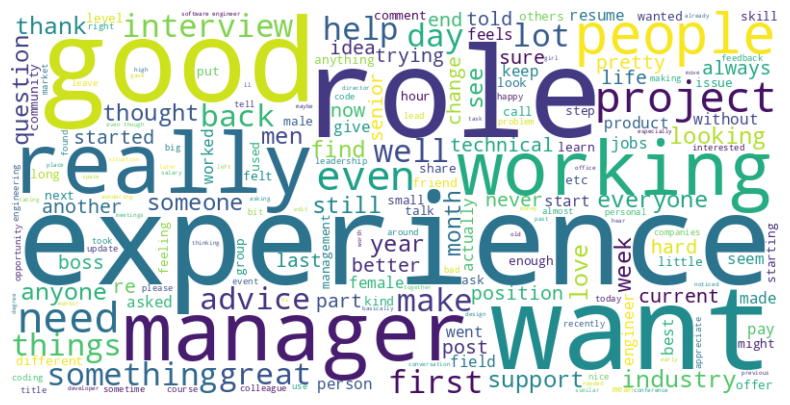

In [ ]:
df_i = dfb[dfb['sentiment']=='positive']
x = contTerms(df_i, 'PostClean',)
term_l = []
for i in x:
  term_l.append(i[0])
creatCloud(df_i, 'PostClean', "BeforeTrumpPositive",term_l)

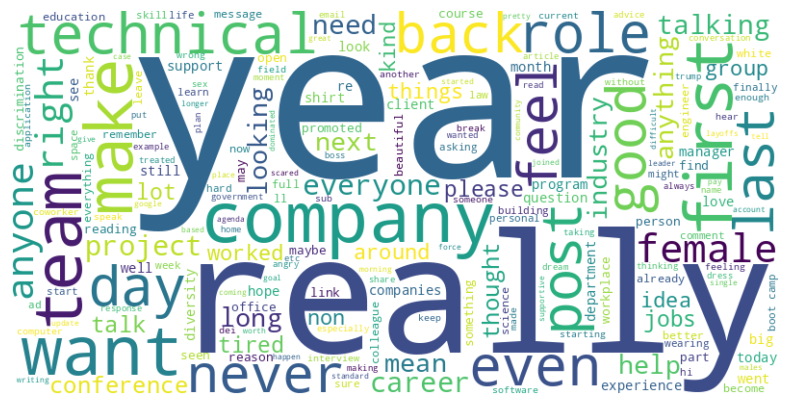

In [ ]:
# after
df_i = dff[dff['irony']=='Yes']
x = contTerms(df_i, 'PostClean',)
term_l = []
for i in x:
  term_l.append(i[0])
creatCloud(df_i, 'PostClean', "AfterTrumpIrony", term_l)

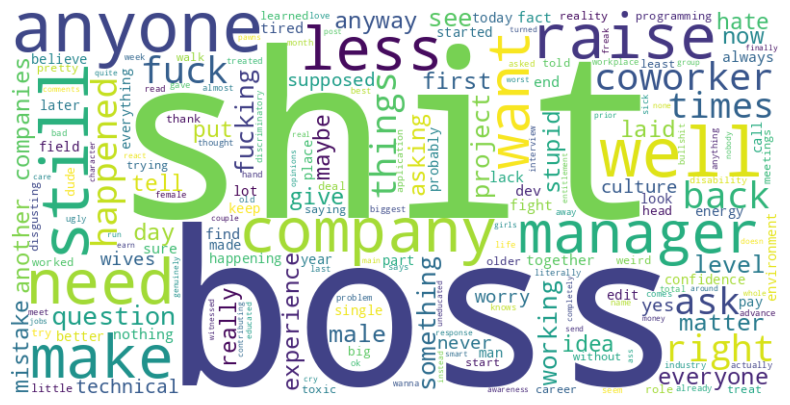

In [ ]:
# after - Offensive
d = dff[dff['offensive']=='Yes']
x = contTerms(off_df, 'PostClean',)
term_l = []
for i in x:
  term_l.append(i[0])
# irony total
creatCloud(d, 'PostClean', "AfterTrumpOffensive", term_l)


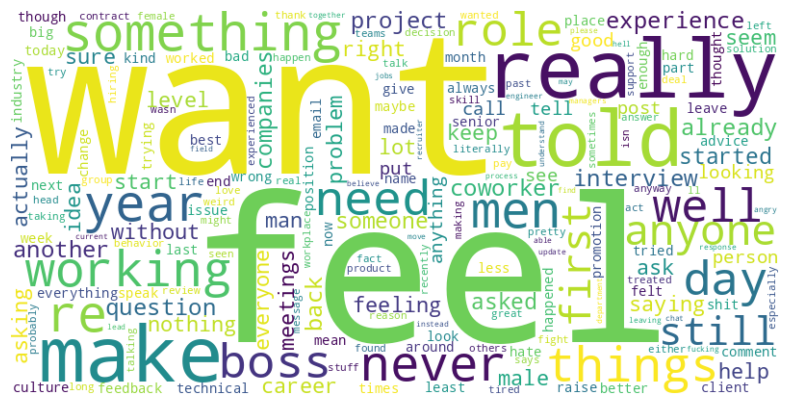

In [ ]:
# after
df_i = dff[dff['emotion']=='anger']
x = contTerms(df_i, 'PostClean',)
term_l = []
for i in x:
  term_l.append(i[0])
creatCloud(df_i, 'PostClean', "AfterTrumpAnger", term_l)

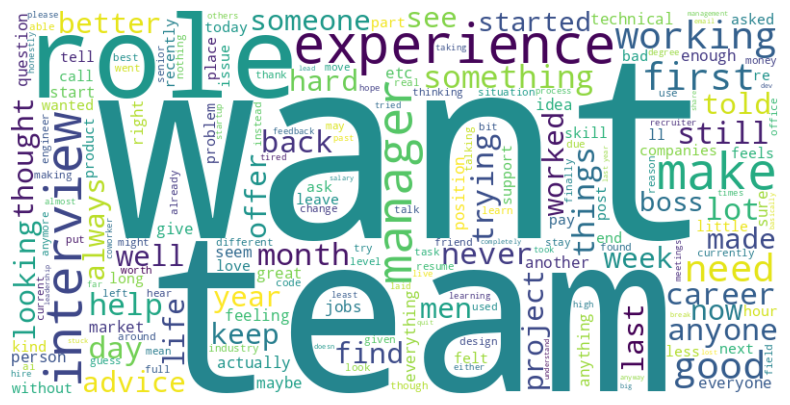

In [ ]:
# after
df_i = dff[dff['emotion']=='sadness']
x = contTerms(df_i, 'PostClean',)
term_l = []
for i in x:
  term_l.append(i[0])
creatCloud(df_i, 'PostClean', "AfterTrumpSadness", term_l)

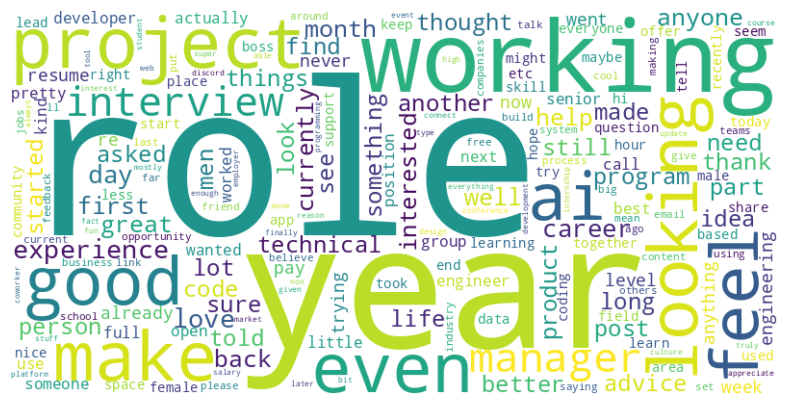

In [ ]:
# after
df_i = dff[dff['emotion']=='joy']
x = contTerms(df_i, 'PostClean',)
term_l = []
for i in x:
  term_l.append(i[0])
creatCloud(df_i, 'PostClean', "AfterTrumpJoy", term_l)

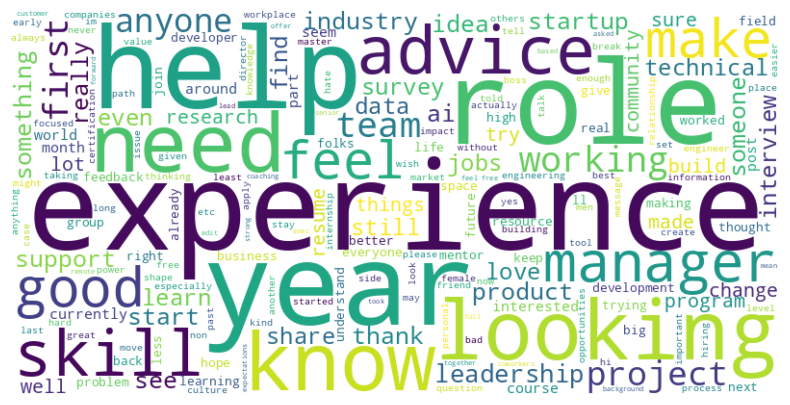

In [ ]:
# after
df_i = dff[dff['emotion']=='optimism']
x = contTerms(df_i, 'PostClean',)
term_l = []
for i in x:
  term_l.append(i[0])
creatCloud(df_i, 'PostClean', "AfterTrumpOptimism", term_l)

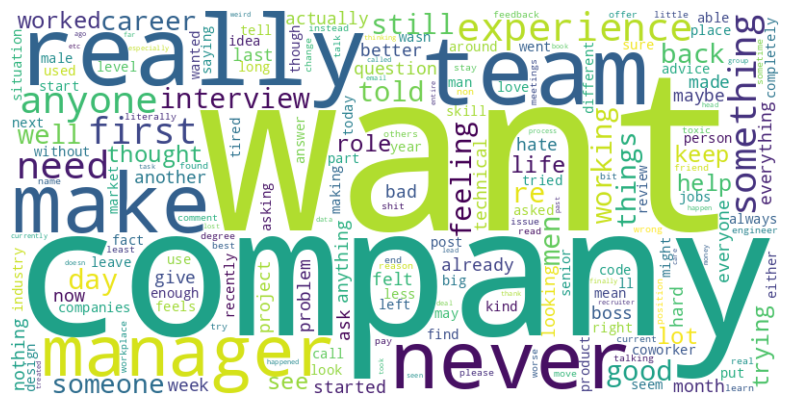

In [ ]:
# after
df_i = dff[dff['sentiment']=='negative']
x = contTerms(df_i, 'PostClean',)
term_l = []
for i in x:
  term_l.append(i[0])
creatCloud(df_i, 'PostClean', "AfterTrumpNegative", term_l)

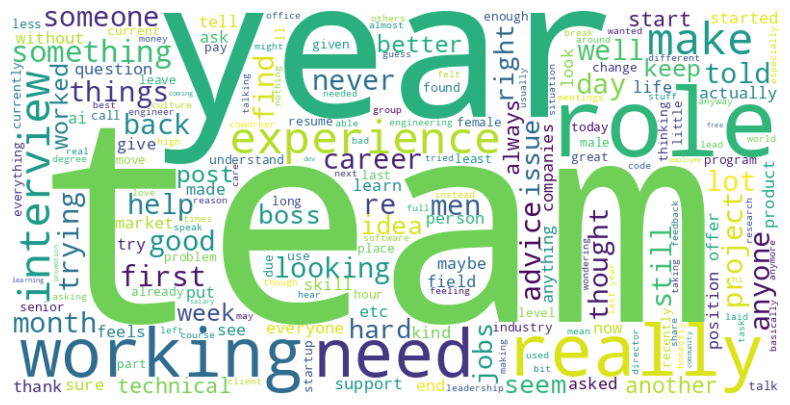

In [ ]:
# after
df_i = dff[dff['sentiment']=='neutral']
x = contTerms(df_i, 'PostClean',)
term_l = []
for i in x:
  term_l.append(i[0])
creatCloud(df_i, 'PostClean', "AfterTrumpNeutral", term_l)

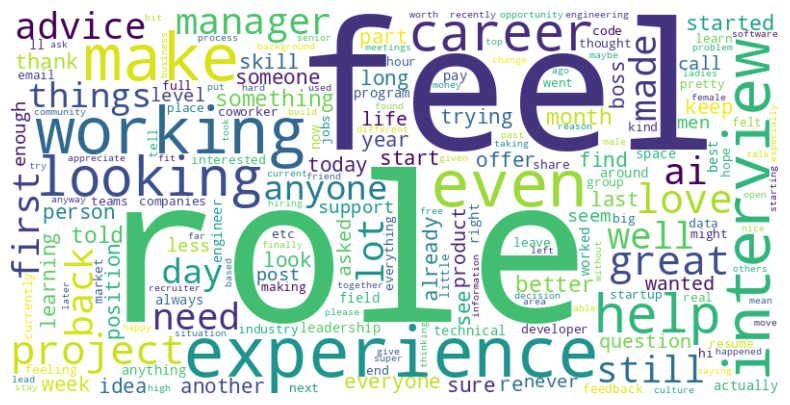

In [ ]:
# after
df_i = dff[dff['sentiment']=='positive']
x = contTerms(df_i, 'PostClean',)
term_l = []
for i in x:
  term_l.append(i[0])
creatCloud(df_i, 'PostClean', "AfterTrumpPositive", term_l)